# Plot LLC data

In [1]:
#%%
# Utility
import os, sys, warnings, importlib
from glob import glob
import string

# which system am I on?
if os.getcwd().split('/')[1] == 'Users': # local personal notebook
    location = 'local'
    rootpath = '/Users/aengenheyster/Documents/Code/PhD/Slab_extremes/'
elif os.getcwd().split('/')[1] in ['network','gf3']: # AOPP system
    location = 'AOPP'
    rootpath = '/network/group/aopp/oceans/LZ001_AENGENHEYSTER_OHUFLUX/Slab/'
    rootpath_data = '/gf3/oceans2/LZ008_AENGENHEYSTER_HADSM4/Slab/'
else:
    raise ValueError('current system location cannot be identfied')

# Data
import numpy as np
import xarray as xr
import cftime
import pandas as pd
import scipy.optimize as opt
import dask
from dask.diagnostics import ProgressBar
import xgcm
import ecco_v4_py as ecco

# Plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
plt.style.use(rootpath + 'notebooks/thesis.mplstyle')
# plt.style.use('/network/group/aopp/oceans/LZ001_AENGENHEYSTER_OHUFLUX/Slab/notebooks/thesis.mplstyle')
# plt.style.use('/network/group/aopp/oceans/LZ001_AENGENHEYSTER_OHUFLUX/Slab/notebooks/notebook.mplstyle')

mpl.rc('hatch',color='k',linewidth=0.5)
import cartopy as cart
import cartopy.crs as ccrs
import seaborn as sns
import palettable as pl
import cmocean.cm as cmo

# Stats
import xskillscore as xs
from scipy import stats
from scipy.stats import kstest, mannwhitneyu
# from mystatsfunctions import LMoments
# import SDFC as sd
from xhistogram.xarray import histogram


# Custom
# Import extremes functions
import sys
sys.path.append(rootpath + 'code/extremes')
import extremes as ex
# Statistical processing of geographical data (xarray mostly)
sys.path.append(rootpath + 'code/')
# import geostats as gs
import ensemble_processing as ep
# Setting up & saving figures 
sys.path.append(rootpath + '../MITgcm_analysis/scripts')
import graphicsfunctions_th as gf

# OceanHeatFunctions - all kinds of useful functions
if location == 'local':
    sys.path.append('/Users/aengenheyster/onedrivenexus/Research/Code/PythonScripts/') 
    import oceanHeatFunctions as ohf 
elif location == 'AOPP':
    sys.path.append('/network/group/aopp/oceans/LZ001_AENGENHEYSTER_OHUFLUX/stack/Oxford/OceanHeatUptake/PythonScripts')
    import oceanHeatFunctions as ohf

import geostats as gs

if location == 'local':
    data_dir = '/Volumes/Research5tb/Slab/CPDN/analysis/'
elif location == 'AOPP':
    data_dir = rootpath + 'analysis/'

def anom(da,dim):
    '''
    Anomalies with respect to one dimension
    '''
    return da - da.mean(dim)

def date(year,month,day):
    # return cftime.Datetime360Day(year, month, day, 12, 0, 0, 0, has_year_zero=False)
    return cftime.Datetime360Day(year, month, day, 12, 0, 0, 0, has_year_zero=True)

/tmp/ipykernel_69774/2417729160.py:33: UserWarning: Style includes a parameter, 'backend', that is not related to style.  Ignoring this parameter.
  plt.style.use(rootpath + 'notebooks/thesis.mplstyle')


# Load data

In [2]:
qsf_0025d = xr.open_dataarray(rootpath_data + '../llc4320_qsnap_daymean_faces_0025deg.nc').squeeze()
sicf_0025d = xr.open_dataarray(rootpath_data + '../llc4320_sicnap_daymean_faces_0025deg.nc').squeeze()

usf_0025d = xr.open_dataarray(rootpath_data + '../llc2160_usnap_daymean_faces_0025deg.nc').squeeze()
vsf_0025d = xr.open_dataarray(rootpath_data + '../llc2160_vsnap_daymean_faces_0025deg.nc').squeeze()

In [4]:
pwd

'/network/group/aopp/oceans/LZ001_AENGENHEYSTER_OHUFLUX/Slab/notebooks'

In [5]:
img_low = plt.imread('/network/group/aopp/oceans/LZ001_AENGENHEYSTER_OHUFLUX/land_ocean_ice_2048.png')
img_high = plt.imread('/network/group/aopp/oceans/LZ001_AENGENHEYSTER_OHUFLUX/land_ocean_ice_8192.png')

In [ ]:
qsf_0025d[::10,::10].plot(robust=True)
plt.figure()
sicf_0025d[::10,::10].plot()

In [ ]:
fig, ax = plt.subplots(subplot_kw=dict(projection=ccrs.PlateCarree()))
ax.set_facecolor('grey')
# qsf_0025d[::10,::10].plot(robust=True,ax=ax,cmap='RdBu_r',vmin=-300,vmax=500)
# qsf_0025d[::10,::10].plot(robust=True,ax=ax,cmap='magma',vmin=-300,vmax=500)
qsf_0025d[::10,::10].plot(robust=True,ax=ax,cmap=pl.scientific.sequential.Devon_20.get_mpl_colormap(),vmin=-300,vmax=500,add_colorbar=False)
# qsf_0025d[::10,::10].plot(robust=True,ax=ax,cmap='Devon_20',vmin=-300,vmax=500)

sicf_0025d[::10,::10].where(lambda x:x!=0).where(lambda x:x>0.01).plot(cmap=cmo.ice,vmin=0,vmax=1,add_colorbar=True)

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')
qsf_0025d[::10,::10].plot.contourf(
    levels=100,
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d[::10,::10].where(lambda x:x!=0).where(lambda x:x>0.01).plot.contourf(
    levels=100,
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_contour_v1.png',dpi=300)

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )

ax.set_facecolor('grey')
ax.imshow(img_low, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

qsf_0025d[::10,::10].plot.contourf(
    levels=100,
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d[::10,::10].where(lambda x:x!=0).where(lambda x:x>0.01).plot.contourf(
    levels=100,
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_contour_v1.png',dpi=300)

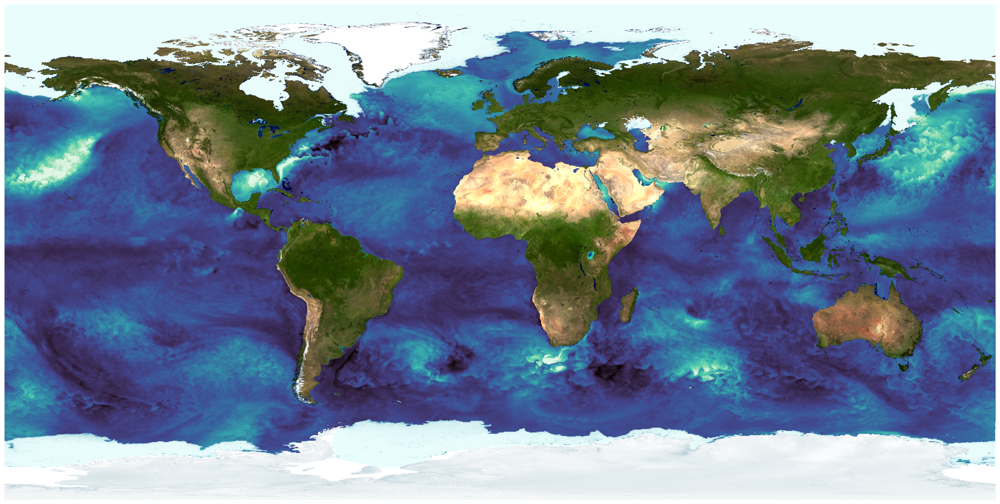

In [49]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')
ax.imshow(img_low, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

# ax.coastlines(lw=2)

qsf_0025d[::10,::10].plot(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d[::10,::10].where(lambda x:x!=0).where(lambda x:x>0.01).plot(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_v1.png',dpi=300)

### with u-shading

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')
ax.imshow(img_low, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

# ax.coastlines(lw=2)

qsf_0025d[::10,::10].plot.imshow(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d[::10,::10].where(lambda x:x!=0).where(lambda x:x>0.01).plot.imshow(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

usf_0025d[::10,::10].plot.imshow(
    ax=ax,
    alpha=0.3,
    cmap=cmo.gray,
    vmin=-0.5,
    vmax=0.5,
    add_colorbar=False,
    transform=ccrs.PlateCarree()
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_shading03_v1.png',dpi=300)

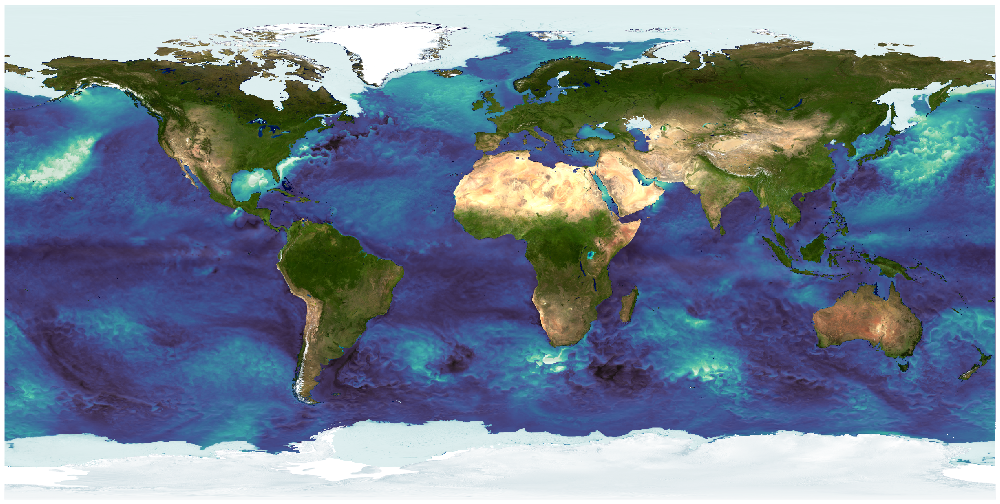

In [11]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')
ax.imshow(img_low, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

# ax.coastlines(lw=2)

qsf_0025d[::10,::10].plot.imshow(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d[::10,::10].where(lambda x:x!=0).where(lambda x:x>0.01).plot.imshow(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

usf_0025d[::10,::10].plot.imshow(
    ax=ax,
    alpha=0.1,
    cmap=cmo.gray,
    vmin=-0.5,
    vmax=0.5,
    add_colorbar=False,
    transform=ccrs.PlateCarree()
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_shading01_v1.png',dpi=300)

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')
ax.imshow(img_low, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

# ax.coastlines(lw=2)

qsf_0025d[::10,::10].plot.imshow(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d[::10,::10].where(lambda x:x!=0).where(lambda x:x>0.01).plot.imshow(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

usf_0025d[::10,::10].plot.imshow(
    ax=ax,
    alpha=0.2,
    cmap=cmo.gray,
    vmin=-0.5,
    vmax=0.5,
    add_colorbar=False,
    transform=ccrs.PlateCarree()
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_shading02_v1.png',dpi=300)

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')
ax.imshow(img_low, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

# ax.coastlines(lw=2)

qsf_0025d[::10,::10].plot.imshow(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d[::10,::10].where(lambda x:x!=0).where(lambda x:x>0.01).plot.imshow(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

usf_0025d[::10,::10].plot.imshow(
    ax=ax,
    alpha=0.05,
    cmap=cmo.gray,
    vmin=-0.5,
    vmax=0.5,
    add_colorbar=False,
    transform=ccrs.PlateCarree()
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_shading005_v1.png',dpi=300)

## High-res

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')
qsf_0025d.plot(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d.where(lambda x:x!=0).where(lambda x:x>0.01).plot(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_v3.png',dpi=300)

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')
qsf_0025d.plot.contourf(
    levels=100,
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d.where(lambda x:x!=0).where(lambda x:x>0.01).plot.contourf(
    levels=100,
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_contour_v2.png',dpi=300)
fig.savefig('qflux_globe_contour_v3.png',dpi=500)


In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')

ax.imshow(img_high, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

qsf_0025d.plot(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d.where(lambda x:x!=0).where(lambda x:x>0.01).plot(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_v3.png',dpi=300)
fig.savefig('qflux_globe_full_v4.png',dpi=500)


In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )

ax.set_facecolor('grey')
ax.imshow(img_high, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

qsf_0025d.plot.contourf(
    levels=100,
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d.where(lambda x:x!=0).where(lambda x:x>0.01).plot.contourf(
    levels=100,
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_contour_v2.png',dpi=300)
fig.savefig('qflux_globe_full_contour_v3.png',dpi=500)


### with u-shading

In [34]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')

ax.imshow(img_high, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

qsf_0025d.plot.imshow(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d.where(lambda x:x!=0).where(lambda x:x>0.01).plot.imshow(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

usf_0025d.plot.imshow(
    ax=ax,
    alpha=0.05,
    cmap=cmo.gray,
    vmin=-0.5,
    vmax=0.5,
    add_colorbar=False,
    transform=ccrs.PlateCarree()
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_HD_shading005_300dpi.png',dpi=300)
fig.savefig('qflux_globe_full_HD_shading005_500dpi.png',dpi=500)

3.6498071178144804

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')

ax.imshow(img_high, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

qsf_0025d.plot.imshow(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d.where(lambda x:x!=0).where(lambda x:x>0.01).plot.imshow(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

usf_0025d.plot.imshow(
    ax=ax,
    alpha=0.1,
    cmap=cmo.gray,
    vmin=-0.5,
    vmax=0.5,
    add_colorbar=False,
    transform=ccrs.PlateCarree()
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_HD_shading01_300dpi.png',dpi=300)
fig.savefig('qflux_globe_full_HD_shading01_500dpi.png',dpi=500)

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')

ax.imshow(img_high, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

qsf_0025d.plot.imshow(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d.where(lambda x:x!=0).where(lambda x:x>0.01).plot.imshow(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

usf_0025d.plot.imshow(
    ax=ax,
    alpha=0.2,
    cmap=cmo.gray,
    vmin=-0.5,
    vmax=0.5,
    add_colorbar=False,
    transform=ccrs.PlateCarree()
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_HD_shading02_300dpi.png',dpi=300)
fig.savefig('qflux_globe_full_HD_shading02_500dpi.png',dpi=500)

In [ ]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),
    # figsize=gf.figsize(1),
    # figsize=(8,4),
    figsize=(22,11),
    # constrained_layout=True
    )
ax.set_facecolor('grey')

ax.imshow(img_high, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

qsf_0025d.plot.imshow(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d.where(lambda x:x!=0).where(lambda x:x>0.01).plot.imshow(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

usf_0025d.plot.imshow(
    ax=ax,
    alpha=0.3,
    cmap=cmo.gray,
    vmin=-0.5,
    vmax=0.5,
    add_colorbar=False,
    transform=ccrs.PlateCarree()
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_HD_shading03_300dpi.png',dpi=300)
fig.savefig('qflux_globe_full_HD_shading03_500dpi.png',dpi=500)

## high-res of similar resolution of 7 inch globe

In [11]:
fig, ax = plt.subplots(
    subplot_kw=dict(projection=ccrs.PlateCarree()),figsize=(44,22))

ax.set_facecolor('grey')

ax.imshow(img_high, origin='upper', extent=(-180,180,-90,90), transform=ccrs.PlateCarree())

qsf_0025d.plot.imshow(
    robust=True,
    ax=ax,
    cmap=sns.color_palette("mako", as_cmap=True),
    vmin=-300,
    vmax=500,
    add_colorbar=False
    )

sicf_0025d.where(lambda x:x!=0).where(lambda x:x>0.01).plot.imshow(
    ax=ax,
    cmap=cmo.ice,
    # vmin=0,
    vmin=-1,
    vmax=1,
    add_colorbar=False
    )

usf_0025d.plot.imshow(
    ax=ax,
    alpha=0.1,
    cmap=cmo.gray,
    vmin=-0.5,
    vmax=0.5,
    add_colorbar=False,
    transform=ccrs.PlateCarree()
    )

ax.spines['geo'].set_linewidth(0)
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.set_xmargin(0)
ax.set_ymargin(0)

fig.savefig('qflux_globe_full_HD_shading01_160dpi.png',dpi=160)
#fig.savefig('qflux_globe_full_HD_shading03_500dpi.png',dpi=500)
